In [5]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelBinarizer
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import confusion_matrix as conMatrix
from sklearn.metrics import classification_report as ClassR
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from uszipcode import SearchEngine

In [7]:
df_airbnb = pd.read_csv('/Users/mihirnevpurkar/Documents/Python/Airbnb_Open_Data.csv')

df_airbnb.head()


/var/folders/ht/4j55yt317t7bqz5bgst7p_yc0000gn/T/ipykernel_2146/2290477915.py:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  df_airbnb = pd.read_csv('/Users/mihirnevpurkar/Documents/Python/Airbnb_Open_Data.csv')


,id,NAME,host id,host_identity_verified,host name,neighbourhood group,neighbourhood,lat,long,country,...,service fee,minimum nights,number of reviews,last review,reviews per month,review rate number,calculated host listings count,availability 365,house_rules,license
0,1001254,Clean & quiet apt home by the park,80014485718,unconfirmed,Madaline,Brooklyn,Kensington,40.64749,-73.97237,United States,...,$193,10.0,9.0,10/19/2021,0.21,4.0,6.0,286.0,Clean up and treat the home the way you'd like...,NaN
1,1002102,Skylit Midtown Castle,52335172823,verified,Jenna,Manhattan,Midtown,40.75362,-73.98377,United States,...,$28,30.0,45.0,5/21/2022,0.38,4.0,2.0,228.0,Pet friendly but please confirm with me if the...,NaN
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,NaN,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,$124,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
3,1002755,NaN,85098326012,unconfirmed,Garry,Brooklyn,Clinton Hill,40.68514,-73.95976,United States,...,$74,30.0,270.0,7/5/2019,4.64,4.0,1.0,322.0,NaN,NaN
4,1003689,Entire Apt: Spacious Studio/Loft by central park,92037596077,verified,Lyndon,Manhattan,East Harlem,40.79851,-73.94399,United States,...,$41,10.0,9.0,11/19/2018,0.10,3.0,1.0,289.0,"Please no smoking in the house, porch or on th...",NaN


In [62]:
missing_df = df_airbnb.isnull().sum(axis=0).reset_index()
missing_df.columns = ['column_name', 'missing_count']
missing_df = missing_df.loc[missing_df['missing_count']>0]
missing_df = missing_df.sort_values(by='missing_count')
missing_df


,column_name,missing_count
10,cancellation_policy,64
9,instant_bookable,89
16,number of reviews,182
12,Construction year,192
13,price,235
14,service fee,262
20,calculated host listings count,290
19,review rate number,311
15,minimum nights,387
21,availability 365,448


In [60]:
missing = df_airbnb.isna().sum()

missing /= df_airbnb.shape[0]
missing *=100
missing = missing.to_frame().rename(columns={0:'Precent Of Missing Values'})
missing

,Precent Of Missing Values
id,0.000000
NAME,0.000000
host id,0.000000
host_identity_verified,0.000000
host name,0.000000
neighbourhood group,0.000000
neighbourhood,0.000000
lat,0.000000
long,0.000000
instant_bookable,0.089551


In [10]:
# Copying our df to new df for safeside
df_new = df_airbnb

In [114]:
### Removing house rules and license column
# Remove column name 'license'
df_airbnb.drop("license", axis=1, inplace=True)
df_airbnb.drop("house_rules", axis=1, inplace=True)
df_airbnb.drop("id", axis=1, inplace=True)
df_airbnb.drop("host id", axis=1, inplace=True)


In [115]:
df_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 97269 entries, 0 to 102598
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   NAME                            97269 non-null  object 
 1   host_identity_verified          97269 non-null  object 
 2   host name                       97269 non-null  object 
 3   neighbourhood group             97269 non-null  object 
 4   neighbourhood                   97269 non-null  object 
 5   lat                             97269 non-null  float64
 6   long                            97269 non-null  float64
 7   instant_bookable                97269 non-null  object 
 8   cancellation_policy             97269 non-null  object 
 9   room type                       97269 non-null  object 
 10  Construction year               97269 non-null  float64
 11  price                           97269 non-null  int64  
 12  service fee                    

In [23]:
## Lets clean the column last review

# 'last_review'
df_airbnb['last review'] = df_airbnb['last review'].fillna('00-00-00')

#reviews per month 

df_airbnb['reviews per month'] = df_airbnb['reviews per month'].fillna(0)


In [25]:
## Lets clean Name columns

df_airbnb['NAME'] = df_airbnb['NAME'].fillna('NY Airbnb')


In [27]:
##lets clean  host_identity_verified 

df_airbnb['host_identity_verified'].unique()

array(['unconfirmed', 'verified', nan], dtype=object)

In [28]:
## Lets replcae na with unconfirmed

df_airbnb['host_identity_verified'] = df_airbnb['host_identity_verified'].fillna('unconfirmed')


In [31]:
## Lets clean Host Name 

df_airbnb['host name'] = df_airbnb['host name'].fillna('John Doe')


In [34]:
## Lets clean neighbourhood group

df_airbnb['neighbourhood group'].value_counts(ascending=False)

Manhattan        43792
Brooklyn         41842
Queens           13267
Bronx             2712
Staten Island      955
brookln              1
manhatan             1
Name: neighbourhood group, dtype: int64

In [35]:
## Manhatan is the most frequent neighbourhood group
## Lets replace NA with Manhattan 

df_airbnb['neighbourhood group'] = df_airbnb['neighbourhood group'].fillna('Manhattan')


In [37]:
## Lets do the same process for Neighbourhood Group


df_airbnb['neighbourhood'].value_counts(ascending=False)
## This column has 224 diferent values and missing value count is just 16
## So lets replace NA with " Unknown "

Bedford-Stuyvesant        7937
Williamsburg              7775
Harlem                    5466
Bushwick                  4982
Hell's Kitchen            3965
                          ... 
Rossville                    3
Lighthouse Hill              3
Fort Wadsworth               2
Glen Oaks                    2
Chelsea, Staten Island       1
Name: neighbourhood, Length: 224, dtype: int64

In [38]:
df_airbnb['neighbourhood'] = df_airbnb['neighbourhood'].fillna('Unknown')


In [40]:
## Lets clean latitude and longitude
df_airbnb[['lat','long']].describe()

#mean is 40.728094	-73.949644

,lat,long
count,102591.000000,102591.000000
mean,40.728094,-73.949644
std,0.055857,0.049521
min,40.499790,-74.249840
25%,40.688740,-73.982580
50%,40.722290,-73.954440
75%,40.762760,-73.932350
max,40.916970,-73.705220


In [41]:
## lets replace na with mean 

df_airbnb['lat'] = df_airbnb['lat'].fillna(40.728094)
df_airbnb['long'] = df_airbnb['long'].fillna(-73.949644)



In [49]:
## country is US ONLY , SO LETS remove country and country_code column

#df_airbnb.drop("country", axis=1, inplace=True)
#df_airbnb.drop("country code", axis=1, inplace=True)


In [54]:
## lets check and clean instant bookable column

df_airbnb['availability 365'].describe()


count    102151.000000
mean        141.133254
std         135.435024
min         -10.000000
25%           3.000000
50%          96.000000
75%         269.000000
max        3677.000000
Name: availability 365, dtype: float64

In [55]:
## first lets remove all the records with < 0 days and > 365 days

df_airbnb.drop(df_airbnb[df_airbnb['availability 365'] < 0].index, inplace = True)

In [57]:
df_airbnb.shape

(102167, 22)

In [127]:
df_airbnb.drop(df_airbnb[df_airbnb['minimum nights'] > 20].index, inplace = True)
df_airbnb.drop(df_airbnb[df_airbnb['minimum nights'] < 0].index, inplace = True)

In [128]:
df_airbnb.shape

(82980, 20)

In [ ]:
df_airbnb.drop(df_airbnb[df_airbnb['availability 365'] > 365].index, inplace = True)


In [65]:
## Lets again check the NA value percentage
missing = df_airbnb.isna().sum()

missing /= df_airbnb.shape[0]
missing *=100
missing = missing.to_frame().rename(columns={0:'Precent Of Missing Values'})
missing

,Precent Of Missing Values
id,0.000000
NAME,0.000000
host id,0.000000
host_identity_verified,0.000000
host name,0.000000
neighbourhood group,0.000000
neighbourhood,0.000000
lat,0.000000
long,0.000000
instant_bookable,0.089551


In [68]:
## Our NA values are less than 1 percent
# Now we can simply remove the record with atleast one NA value

df_airbnb = df_airbnb.dropna()

In [69]:
missing = df_airbnb.isna().sum()

missing /= df_airbnb.shape[0]
missing *=100
missing = missing.to_frame().rename(columns={0:'Precent Of Missing Values'})
missing

,Precent Of Missing Values
id,0.0
NAME,0.0
host id,0.0
host_identity_verified,0.0
host name,0.0
neighbourhood group,0.0
neighbourhood,0.0
lat,0.0
long,0.0
instant_bookable,0.0


In [93]:
## lets clean price and service fee column service fee


df_airbnb['price'] = df_airbnb['price'].str.replace('$', '')

df_airbnb['service fee'] = df_airbnb['service fee'].str.replace('$', '')

df_airbnb['price'] = df_airbnb['price'].str.replace(',', '')

df_airbnb['service fee'] = df_airbnb['service fee'].str.replace(',', '')

#df_airbnb['price'] = df_airbnb['price'].astype(float)
#df_airbnb['service fee'] = df_airbnb['service fee'].astype(float)

In [98]:
#df_airbnb.head(100)


df_airbnb['price'] = pd.to_numeric(df_airbnb['price'])
df_airbnb['service fee'] = pd.to_numeric(df_airbnb['price'])


#print (df_airbnb[pd.to_numeric(df_airbnb['service fee'], errors='coerce').isnull()])
df_airbnb.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 97269 entries, 0 to 102598
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              97269 non-null  int64  
 1   NAME                            97269 non-null  object 
 2   host id                         97269 non-null  int64  
 3   host_identity_verified          97269 non-null  object 
 4   host name                       97269 non-null  object 
 5   neighbourhood group             97269 non-null  object 
 6   neighbourhood                   97269 non-null  object 
 7   lat                             97269 non-null  float64
 8   long                            97269 non-null  float64
 9   instant_bookable                97269 non-null  object 
 10  cancellation_policy             97269 non-null  object 
 11  room type                       97269 non-null  object 
 12  Construction year              

In [116]:
###Lets save cleaned data

df_airbnb.to_csv('cl_airbnb.csv', encoding='utf-8', index=False)



In [74]:
##Lets do EDA

import numpy as np
import pandas as pd
from pandas import Series,DataFrame

import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

plt.rcParams['figure.figsize'] = (20,10)
plt.style.use('dark_background')

import warnings
warnings.filterwarnings('ignore')



(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Brooklyn'),
  Text(1, 0, 'Manhattan'),
  Text(2, 0, 'brookln'),
  Text(3, 0, 'Bronx'),
  Text(4, 0, 'Queens'),
  Text(5, 0, 'Staten Island')])

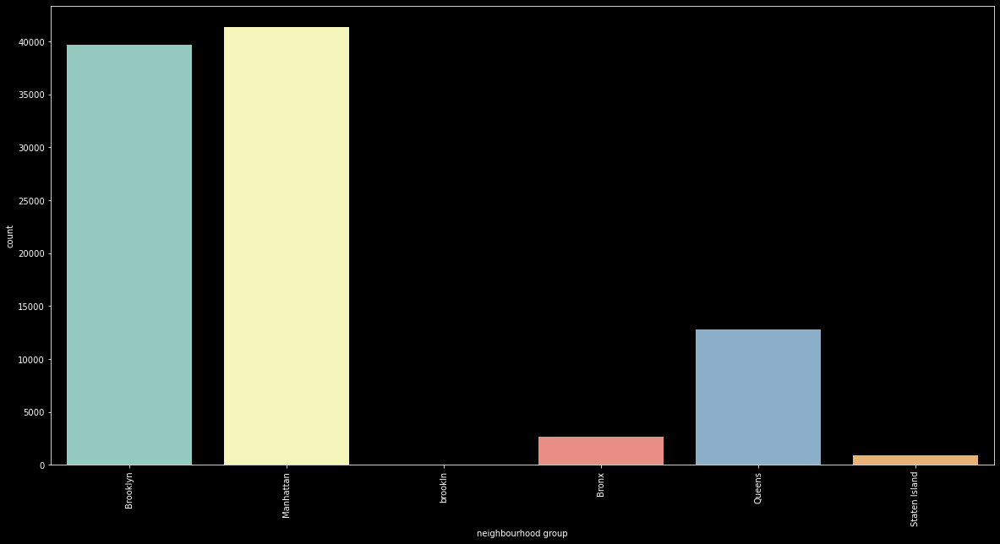

In [102]:
sns.countplot('neighbourhood group',data=df_airbnb)
plt.xticks(rotation=90)

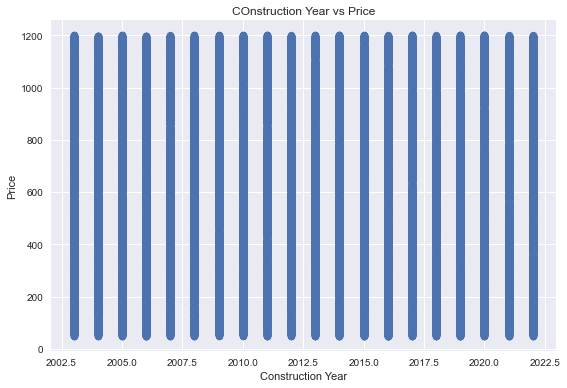

In [108]:
## lets try to find relation between construction year and price

plt.style.use('seaborn')  # to get seaborn scatter plot

# read the csv file to extract data


con_year = df_airbnb['Construction year']
price = df_airbnb['price']


plt.scatter(con_year, price)

plt.title('COnstruction Year vs Price')
plt.xlabel('Construction Year')
plt.ylabel('Price')

plt.tight_layout()
plt.show()

##we can see that construction year might be not be the only factor which is contributing towards price

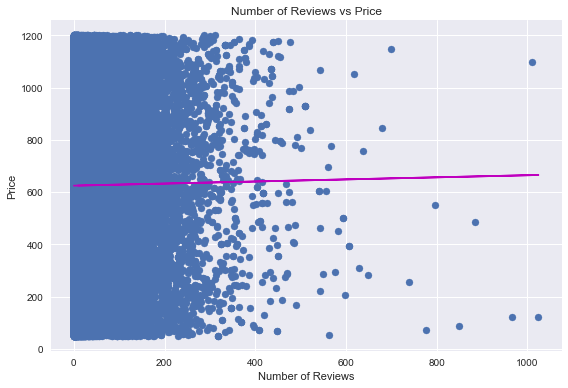

In [113]:

reviews_count = df_airbnb['number of reviews']
price = df_airbnb['price']


plt.scatter(reviews_count, price)

plt.title('Number of Reviews vs Price')
plt.xlabel('Number of Reviews')
plt.ylabel('Price')

plt.tight_layout()


z = np.polyfit(reviews_count, price, 1)

p = np.poly1d(z)

plt.plot(reviews_count, p(reviews_count), 'm-')

plt.show()

In [117]:
#sorting numeric and non numeric features

numeric_features = df_airbnb.select_dtypes(include=['int64','float64']).columns
nominal_features = df_airbnb.select_dtypes(include=['object'])
numeric_features=numeric_features.delete(0)

df_airbnb.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 97269 entries, 0 to 102598
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   NAME                            97269 non-null  object 
 1   host_identity_verified          97269 non-null  object 
 2   host name                       97269 non-null  object 
 3   neighbourhood group             97269 non-null  object 
 4   neighbourhood                   97269 non-null  object 
 5   lat                             97269 non-null  float64
 6   long                            97269 non-null  float64
 7   instant_bookable                97269 non-null  object 
 8   cancellation_policy             97269 non-null  object 
 9   room type                       97269 non-null  object 
 10  Construction year               97269 non-null  float64
 11  price                           97269 non-null  int64  
 12  service fee                    

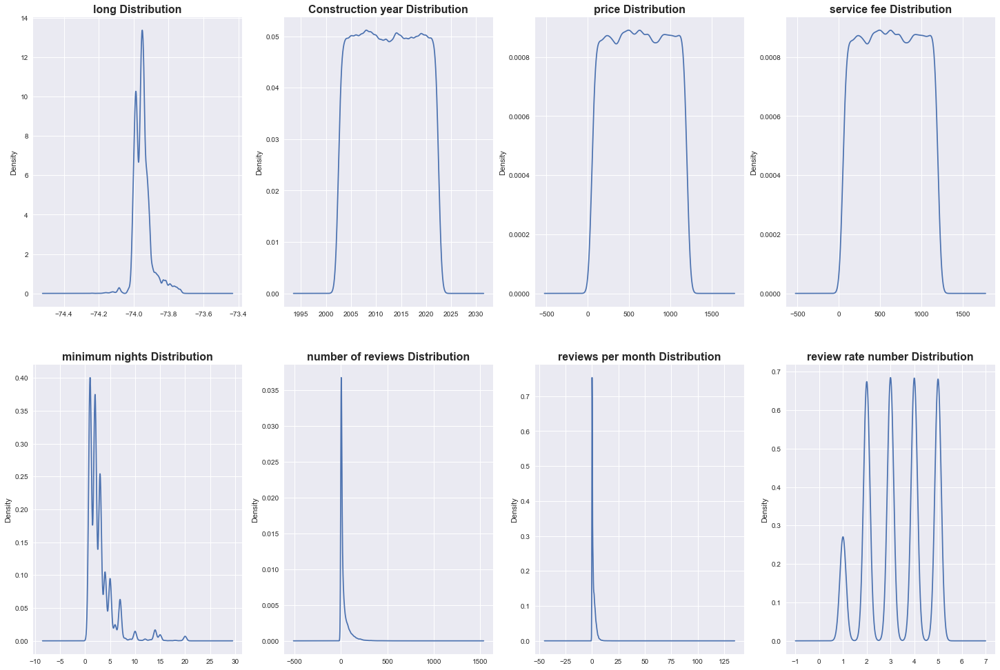

In [129]:
fig, axes = plt.subplots(nrows=2, ncols=4)
aux = 0
fig.set_figheight(17)
fig.set_figwidth(25)
for row in axes:
    for col in row:
        df_airbnb[numeric_features[aux]].plot(kind='kde',ax=col)
        col.set_title(numeric_features[aux] +' Distribution',fontsize=16,fontweight='bold')
        aux+=1


In [124]:
df_airbnb['number of reviews'].describe()

count    97269.000000
mean        27.054868
std         48.740808
min          0.000000
25%          1.000000
50%          7.000000
75%         30.000000
max       1024.000000
Name: number of reviews, dtype: float64

In [125]:
df_airbnb['minimum nights'].describe()


count    97269.000000
mean         8.122207
std         28.957350
min      -1223.000000
25%          2.000000
50%          3.000000
75%          5.000000
max       5645.000000
Name: minimum nights, dtype: float64

In [135]:
df_airbnb['price'].describe()


count    82980.000000
mean       626.263895
std        331.232420
min         50.000000
25%        341.000000
50%        626.000000
75%        913.000000
max       1200.000000
Name: price, dtype: float64

In [146]:
pr_data =df_airbnb.copy()

In [148]:
pr_data.shape

(82980, 20)

In [161]:
##after removing outliers
# 

from plotly.subplots import make_subplots
import plotly.graph_objs as go


fig = make_subplots(
    rows=2, cols=2,
    column_widths=[0.6, 0.4],
    row_heights=[0.6, 0.5],
    specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
           [            None                    , {"type": "bar"}]])

fig.add_trace(
    go.Bar(y=pr_data['room type'].value_counts(),x=pr_data['room type'].value_counts().index,name='Room Type'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(y=pr_data['minimum nights'].value_counts(),x=pr_data['minimum nights'].value_counts().index,name='Minimum Nights'),
    row=2, col=2
)

fig.add_trace(
    #go.Scatter3d(x=pr_data.longitude, y=pr_data.latitude,z=pr_data.price,color=pr_data.room_type,mode='markers'),
    go.Scattergeo(lat=pr_data["lat"],
                  lon=pr_data["long"],
                  mode="markers",
                  text=pr_data.price,
                  hoverinfo="text",
                  showlegend=True,
                  name='Price'
                  ,
                  marker=dict(color="crimson", size=4, opacity=0.8)),
    row=1, col=1
)

fig.update_geos(
    projection_type="orthographic",
    landcolor="white",
    oceancolor="MidnightBlue",
    showocean=True,
    lakecolor="LightBlue",
    projection_rotation_lon=-92,
    projection_rotation_lat=15

)

fig.update_xaxes(tickangle=45)

fig.update_layout(title='Distribution Of Different Room Types')
fig.show()



In [162]:
##after removing outliers
# 

from plotly.subplots import make_subplots
import plotly.graph_objs as go


fig = make_subplots(
    rows=2, cols=2,
    column_widths=[0.6, 0.4],
    row_heights=[0.6, 0.5],
    specs=[[{"type": "scattergeo", "rowspan": 2}, {"type": "bar"}],
           [            None                    , {"type": "bar"}]])

fig.add_trace(
    go.Bar(y=pr_data['neighbourhood group'].value_counts(),x=pr_data['neighbourhood group'].value_counts().index,name='Area'),
    row=1, col=2
)
fig.add_trace(
    go.Bar(y=pr_data['price'],x=pr_data['neighbourhood group'],name='Price'),
   row=2, col=2
)

fig.add_trace(
    #go.Scatter3d(x=pr_data.longitude, y=pr_data.latitude,z=pr_data.price,color=pr_data.room_type,mode='markers'),
    go.Scattergeo(lat=pr_data["lat"],
                  lon=pr_data["long"],
                  mode="markers",
                  text=pr_data.price,
                  hoverinfo="text",
                  showlegend=True,
                  name='Price'
                  ,
                  marker=dict(color="crimson", size=4, opacity=0.8)),
    row=1, col=1
)

fig.update_geos(
    projection_type="satellite",
    landcolor="white",
    oceancolor="MidnightBlue",
    showocean=True,
    lakecolor="LightBlue",
    projection_rotation_lon=-92,
    projection_rotation_lat=15,
    fitbounds="locations",
    showsubunits=True

)

fig.update_xaxes(tickangle=45)

fig.update_layout(title='Distribution Of Areas')
fig.show()

